In [1]:
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:75% !important; }</style>"))

In [2]:
from tqdm.notebook import tqdm
from ipywidgets import Video
from collections import deque

import matplotlib.pyplot as plt

import numpy as np
import pandas as pd


import cv2
import math
import os
import sys
import time
import re
import glob

tqdm.pandas()

In [3]:
FPS = 10
FPS_POSTFIX = f'_{FPS}fps' if FPS else ''
POSTFIX = '' # '_val'
FRAME_FOLDER = f'C:/Users/markw/Downloads/ngt{FPS_POSTFIX}{POSTFIX}'
print(f'FRAME_FOLDER: {FRAME_FOLDER}')

FRAME_FOLDER: C:/Users/markw/Downloads/ngt_10fps


In [4]:
print(f'Python version: {sys.version}')

Python version: 3.7.4 (default, Aug  9 2019, 18:34:13) [MSC v.1915 64 bit (AMD64)]


In [5]:
try:
    dir_path = 'C:/Users/markw/Documents/openpose/build'
    sys.path.append(f'{dir_path}/python/openpose/Release');
    os.environ['PATH']  = os.environ['PATH'] + ';' + f'{dir_path}/x64/Release;' +  '{dir_path}/bin;'
    import pyopenpose as op
    
    print(f'OpenPose GPU number: {op.get_gpu_number()}')
except ImportError as e:
    print('Error: OpenPose library could not be found. Did you enable `BUILD_PYTHON` in CMake and have this Python script in the right folder?')
    raise e

OpenPose GPU number: 1


# Body 25 Net

In [6]:
MODEL_DIR = 'openpose/models'

N_POSE_KEYPOINTS = 25

# edges of body keypoints
BODY25_PAIRS = [
    (1, 8), (1,2), (1,5), (2,3), (3, 4), (5, 6), (6, 7), (8, 9), (9, 10), (10, 11),
    (8, 12), (12, 13), (13, 14), (1, 0), (0, 15), (15, 17), (0, 16), (16, 18), (2, 17), (5, 18),
    (14, 19) ,(19, 20), (14, 21), (11, 22), (22, 23), (11, 24),
]

# map integer encoded body keypoints to natural language
BODY25_IDX_2_KEYPOINT = dict({
    0: "Nose",
    1: "Neck",
    2: "RShoulder",
    3: "RElbow",
    4: "RWrist",
    5: "LShoulder",
    6: "LElbow",
    7: "LWrist",
    8: "MidHip",
    9: "RHip",
    10: "RKnee",
    11: "RAnkle",
    12: "LHip",
    13: "LKnee",
    14: "LAnkle",
    15: "REye",
    16: "LEye",
    17: "REar",
    18: "LEar",
    19: "LBigToe",
    20: "LSmallToe",
    21: "LHeel",
    22: "RBigToe",
    23: "RSmallToe",
    24: "RHeel",
    25: "Background",
})

BODY25_KEYPOINT_2_IDX = dict(zip(BODY25_IDX_2_KEYPOINT.values(), BODY25_IDX_2_KEYPOINT.keys()))

WRISTS_IDXS = [BODY25_KEYPOINT_2_IDX.get(keypoint) for keypoint in ['LWrist', 'RWrist']]

In [7]:
# plots an image with correct color channels
def plot(img):
    plt.figure(figsize=(15,10))
    plt.grid()
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))

# Load Images

In [8]:
TARGET_SIZE = 368
# TODO create 10FPS train_ngt
train_ngt = pd.read_pickle('train_ngt_dxy_10fps.pkl')
pd.options.display.max_colwidth = 99
display(train_ngt.head())

,file_path,file_name,sign_names,label,is_studio,frame_count,folder_index,Signbank ID,left_dx_rolling1_10fps,left_dy_rolling1_10fps,...,right_dx_rolling4_10fps,right_dy_rolling4_10fps,left_dx_rolling5_10fps,left_dy_rolling5_10fps,right_dx_rolling5_10fps,right_dy_rolling5_10fps,Handedness,HandednessNorm,Handedness Predicted,keyframe_idxs
0,C:/Users/markw/Documents/Master Stage Videos/NGTvideos/#A-3808.mp4,#A-3808.mp4,#A,0,True,31,0,3808,"(0.0, -0.013702392578125, -0.0022430419921875, 4.9833221435546875, -0.0057373046875, 0.04003906...","(0.0, 0.97222900390625, -0.98895263671875, -1.01397705078125, 0.014129638671875, -1.05078125, 0...",...,"(0.0, 0.0010986328125, -4.6719970703125, -11.257658004760742, -16.25483512878418, -21.756418228...","(0.0, 0.4927215576171875, -2.3442789713541665, -14.001640319824219, -24.25463104248047, -37.485...","(0.0, -0.0068511962890625, -0.005315144856770833, 1.2418441772460938, 0.992327880859375, 1.0003...","(0.0, 0.486114501953125, -0.005574544270833333, -0.2576751708984375, -0.203314208984375, -0.413...","(0.0, 0.0010986328125, -4.6719970703125, -11.257658004760742, -13.003868103027344, -17.40469512...","(0.0, 0.4927215576171875, -2.3442789713541665, -14.001640319824219, -19.403704833984374, -29.79...",1,1.0,True,"(4, 13, 22, 31)"
1,C:/Users/markw/Documents/Master Stage Videos/NGTvideos/#B-3809.mp4,#B-3809.mp4,#B,1,True,31,1,3809,"(0.0, 1.9644317626953125, -0.0078125, 0.994171142578125, 2.9813232421875, 0.0075531005859375, -...","(0.0, -4.9708251953125, 0.00933837890625, 3.941070556640625, -1.9759521484375, -1.0029602050781...",...,"(0.0, -3.4920806884765625, -4.995005289713542, -12.007160186767578, -16.007579803466797, -16.51...","(0.0, -2.9847564697265625, -7.659403483072917, -21.24176788330078, -29.752479553222656, -36.759...","(0.0, 0.9822158813476562, 0.6522064208984375, 0.7376976013183594, 1.1864227294921874, 1.1879333...","(0.0, -2.48541259765625, -1.6538289388020833, -0.25510406494140625, -0.599273681640625, -0.7998...","(0.0, -3.4920806884765625, -4.995005289713542, -12.007160186767578, -12.806063842773437, -14.61...","(0.0, -2.9847564697265625, -7.659403483072917, -21.24176788330078, -23.801983642578126, -30.601...",1,1.0,True,"(4, 13, 22, 31)"
2,C:/Users/markw/Documents/Master Stage Videos/NGTvideos/#C-3810.mp4,#C-3810.mp4,#C,2,True,30,2,3810,"(0.0, -1.009979248046875, 0.0061798095703125, 2.9918975830078125, 1.0074005126953125, 0.9925842...","(0.0, 1.013702392578125, 0.965545654296875, -4.929962158203125, 0.00323486328125, 0.94909667968...",...,"(0.0, 0.00383758544921875, 0.005218505859375, -5.502399444580078, -13.24822998046875, -19.00902...","(0.0, 0.4886932373046875, -0.0019429524739583333, -5.261375427246094, -15.254859924316406, -31....","(0.0, -0.5049896240234375, -0.3345998128255208, 0.4970245361328125, 0.5990997314453125, 0.79761...","(0.0, 0.5068511962890625, 0.6597493489583334, -0.7376785278320312, -0.589495849609375, -0.39967...","(0.0, 0.00383758544921875, 0.005218505859375, -5.502399444580078, -10.598583984375, -15.2056884...","(0.0, 0.4886932373046875, -0.0019429524739583333, -5.261375427246094, -12.203887939453125, -24....",1,1.0,True,"(4, 12, 21, 30)"
3,C:/Users/markw/Documents/Master Stage Videos/NGTvideos/#D-3811.mp4,#D-3811.mp4,#D,3,True,31,3,3811,"(0.0, -0.0216827392578125, 0.0353546142578125, 0.969146728515625, 0.99822998046875, 0.996322631...","(0.0, 0.959136962890625, -0.971771240234375, -4.00390625, -0.007781982421875, -0.00540161132812...",...,"(0.0, 0.9865646362304688, 0.9886983235677084, -2.005504608154297, -5.757072448730469, -14.74409...","(0.0, 0.021759033203125, 0.009602864583333334, -2.2544479370117188, -8.498985290527344, -22.511...","(0.0, -0.01084136962890625, 0.004557291666666667, 0.24570465087890625, 0.396209716796875, 0.595...","(0.0, 0.4795684814453125, -0.00421142578125, -1.0041351318359375, -0.804864501953125, -0.805944...","(0.0, 0.9865646362304688, 0.9886983235677084, -2.005504608154297, -4.605657958984375, -11.40064...","(0.0, 0.021759033203125

In [9]:
train_ngt.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3846 entries, 0 to 3845
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   file_path                3846 non-null   object 
 1   file_name                3846 non-null   object 
 2   sign_names               3846 non-null   object 
 3   label                    3846 non-null   int64  
 4   is_studio                3846 non-null   bool   
 5   frame_count              3846 non-null   int64  
 6   folder_index             3846 non-null   int64  
 7   Signbank ID              3846 non-null   int64  
 8   left_dx_rolling1_10fps   3846 non-null   object 
 9   left_dy_rolling1_10fps   3846 non-null   object 
 10  right_dx_rolling1_10fps  3846 non-null   object 
 11  right_dy_rolling1_10fps  3846 non-null   object 
 12  left_dx_rolling2_10fps   3846 non-null   object 
 13  left_dy_rolling2_10fps   3846 non-null   object 
 14  right_dx_rolling2_10fps 

In [10]:
def load_video(file_path, fps=FPS):
    vid = cv2.VideoCapture(file_path)
    vid_fps = vid.get(cv2.CAP_PROP_FPS)
    frames_sample = vid_fps // fps
    res = []
    idx = 0
    while vid.isOpened():
        succes, frame = vid.read()
        if succes and int(frame.mean()) > 0 and frame.std() > 10:
            if idx % frames_sample == 0:
                # cutout center square
                h, w, _ = frame.shape
                s = min(h, w)
                d = abs(h - w) // 2
                if h > w:
                    frame = frame[d : d + s, :]
                else:
                    frame = frame[:, d : d + s]
                # resize
                frame = cv2.resize(frame, (TARGET_SIZE, TARGET_SIZE))
                res.append(frame)
        else:
            return np.array(res)
        idx += 1

In [11]:
def load_folder(folder_index):
    frame_file_paths = glob.glob(f'{FRAME_FOLDER}/rgb/{folder_index}/*.jpg')
    res = []
    for fp in frame_file_paths:
        frame = cv2.imread(fp)
        if frame.std() > 10:
            # cutout center square
            h, w, _ = frame.shape
            s = min(h, w)
            d = abs(h - w) // 2
            if h > w:
                frame = frame[d : d + s, :]
            else:
                frame = frame[:, d : d + s]
            # resize
            frame = cv2.resize(frame, (TARGET_SIZE, TARGET_SIZE))
            res.append(frame)
    return np.array(res)

In [12]:
%%time
# define file_path
file_path_video = train_ngt.loc[0, f'file_path']
# read video frames, sample
video_frames = load_video(file_path_video)
print(f'file name: {file_path_video.split("/")[-1]}')
print(f'video_frames shape: {video_frames.shape}, video_frames dtype: {video_frames.dtype}')

file name: #A-3808.mp4
video_frames shape: (38, 368, 368, 3), video_frames dtype: uint8
Wall time: 844 ms


In [13]:
Video.from_file(file_path_video)

Video(value=b'\x00\x00\x00 ftypM4V \x00\x00\x00\x01M4V M4A isommp42\x00\x00\x00\x01mdat\x00\x00\x00\x00\x00\x0…

# OpenPose Model

In [14]:
# OpenPose python wrapper
opWrapper = op.WrapperPython()
# OpenPose configuration
opWrapper.configure({
    'model_folder': 'C:/Users/markw/Documents/openpose/build/models',
    'model_pose': 'BODY_25',
    'net_resolution': f'-1x{TARGET_SIZE}', # default resolution
})
opWrapper.start()
net = op.Datum()

# Wrist Keypoints

In [15]:
def get_body_keypoints(net, frame, wrists_only=False):
    # set input image
    net.cvInputData = frame
    # no documentation available...
    opWrapper.emplaceAndPop([net])
    # get body keypoints
    pose_keypoints = net.poseKeypoints[0]
    
    if wrists_only:
        return pose_keypoints[WRISTS_IDXS]
    else:
        return pose_keypoints

In [16]:
def get_video_wrist_keypoints(net, video_frames):
    lwrist_keypoints = []
    rwrist_keypoints = []
    for frame in video_frames:
        (l_x, l_y, l_prob), (r_x, r_y, r_prob) = get_body_keypoints(net, frame, wrists_only=True)
        lwrist_keypoints.append((l_x, l_y))
        rwrist_keypoints.append((r_x, r_y))
        
    return lwrist_keypoints, rwrist_keypoints

In [17]:
l, r = get_video_wrist_keypoints(net, video_frames)

# FIDDLE

In [21]:
row = df.loc[df['sign_names'] == 'PENSIOEN-B'].squeeze()

In [22]:
row['file_path']

'C:/Users/markw/Documents/Master Stage Videos/NGTvideos/PENSIOEN-B-581.mp4'

In [24]:
video_frames = load_video(row['file_path'], fps=50.0)
# get left and right wrist pixel coordinates
l, r = get_video_wrist_keypoints(net, video_frames)

In [25]:
print(f'len l: {len(l)}, len r: {len(r)}, video_frames shape: {video_frames.shape}')

len l: 172, len r: 172, video_frames shape: (172, 368, 368, 3)


In [26]:
res = 368

In [29]:
# os.makedirs('temp/pres_open_pose')

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300

frames = None
file_path = row[f'file_path{POSTFIX}']
vid = cv2.VideoCapture(file_path)
fps_video = vid.get(cv2.CAP_PROP_FPS)
print(f'fps_video: {fps_video}')
counter = 0
frame_counter = 0
frames_plotted = 0
plt.figure()
with tqdm(total=len(video_frames)) as pbar:
    while vid.isOpened():
        succes, frame = vid.read()
        if succes:
            h_frame, w_frame, _ = frame.shape
            offset = (w_frame - 368) // 2
            frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

            plt.imshow(frame)
            plt.scatter(offset+l[frame_counter][0], l[frame_counter][1], c='green', s=40)
            plt.scatter(offset+r[frame_counter][0], r[frame_counter][1], c='green', s=40)
            plt.axis(False)
            plt.savefig(f'temp/pres_open_pose/frame_{frame_counter}.jpg')

            frames_plotted += 1
            counter += 1
            frame_counter += 1
            pbar.update(1)
        else:
            break

        plt.clf()

fps_video: 50.0


  0%|          | 0/172 [00:00<?, ?it/s]

<Figure size 1800x1200 with 0 Axes>

In [30]:
import cv2
import os

image_folder = 'temp/pres_open_pose/'
video_name = 'pres_open_pose.avi'

images = [f'frame_{i}.jpg' for i in range(len(video_frames))]
frame = cv2.imread(os.path.join(image_folder, images[0]))
height, width, layers = frame.shape

video = cv2.VideoWriter(video_name, 0, 50, (width,height))

for image in images:
    video.write(cv2.imread(os.path.join(image_folder, image)))

cv2.destroyAllWindows()
video.release()

# Rolling Delta Wrist Keypoint

In [18]:
def get_xy_delta(l):
    l_x = [x for (x, y) in l]
    l_y = [y for (x, y) in l]
    s_x = pd.Series(l_x)
    s_y = pd.Series(l_y)
    d_x = (s_x - s_x.shift(1)).fillna(0).tolist()
    d_y = (s_y - s_y.shift(1)).fillna(0).tolist()
    
    return d_x, d_y

In [19]:
def get_rolling_delta(l, maxlen):
    l_r = []
    r = deque(maxlen=maxlen)
    for d in l:
        r.append(d)
        l_r.append(np.array(r).mean())

    return l_r

In [20]:
def plot_rolling_delta(l, rolling_windows, title, ax, r, c):
    rs = []
    for rw in rolling_windows:
        l_r = get_rolling_delta(l, rw)
        ax[r, c].plot(l_r, label=f'rolling {rw}')
        
    ax[r,c].set_title(title, size=16)
    ax[r,c].legend(loc='upper left', prop={'size': 12})

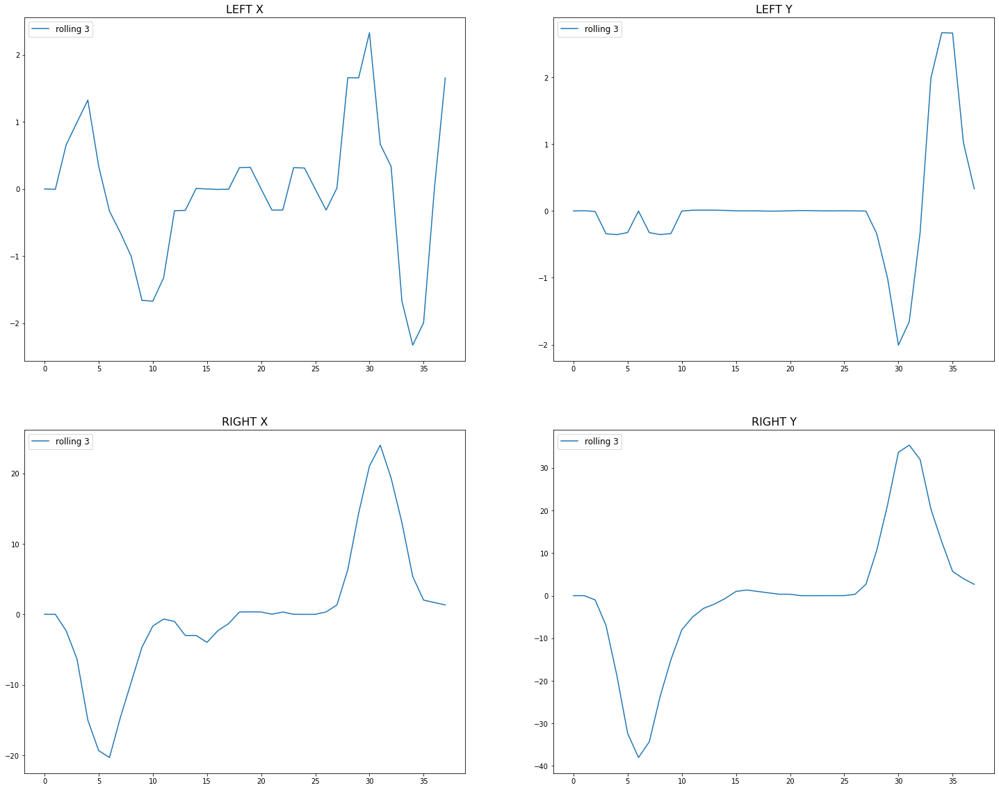

In [21]:
l_dx, l_dy = get_xy_delta(l)
r_dx, r_dy = get_xy_delta(r)

fig, ax = plt.subplots(2, 2, figsize=(25,20))

rolling_windows = [3]
plot_rolling_delta(l_dx, rolling_windows, 'LEFT X', ax, 0, 0)
plot_rolling_delta(l_dy, rolling_windows, 'LEFT Y', ax, 0, 1)
plot_rolling_delta(r_dx, rolling_windows, 'RIGHT X', ax, 1, 0)
plot_rolling_delta(r_dy, rolling_windows, 'RIGHT Y', ax, 1, 1)
plt.show()

# Compute DXY

In [19]:
# file = f'ngt_signbank_validation_filtered_300_cats_dxy_{FPS}fps.pkl.xz'
file = 'train_ngt_dxy_10fps.pkl'
df = pd.read_pickle(file)

In [20]:
display(df.head())

,file_path,file_name,sign_names,label,is_studio,frame_count,folder_index,Signbank ID,left_dx_rolling1_10fps,left_dy_rolling1_10fps,...,right_dx_rolling4_10fps,right_dy_rolling4_10fps,left_dx_rolling5_10fps,left_dy_rolling5_10fps,right_dx_rolling5_10fps,right_dy_rolling5_10fps,Handedness,HandednessNorm,Handedness Predicted,keyframe_idxs
0,C:/Users/markw/Documents/Master Stage Videos/NGTvideos/#A-3808.mp4,#A-3808.mp4,#A,0,True,31,0,3808,"(0.0, -0.013702392578125, -0.0022430419921875, 4.9833221435546875, -0.0057373046875, 0.04003906...","(0.0, 0.97222900390625, -0.98895263671875, -1.01397705078125, 0.014129638671875, -1.05078125, 0...",...,"(0.0, 0.0010986328125, -4.6719970703125, -11.257658004760742, -16.25483512878418, -21.756418228...","(0.0, 0.4927215576171875, -2.3442789713541665, -14.001640319824219, -24.25463104248047, -37.485...","(0.0, -0.0068511962890625, -0.005315144856770833, 1.2418441772460938, 0.992327880859375, 1.0003...","(0.0, 0.486114501953125, -0.005574544270833333, -0.2576751708984375, -0.203314208984375, -0.413...","(0.0, 0.0010986328125, -4.6719970703125, -11.257658004760742, -13.003868103027344, -17.40469512...","(0.0, 0.4927215576171875, -2.3442789713541665, -14.001640319824219, -19.403704833984374, -29.79...",1,1.0,True,"(4, 13, 22, 31)"
1,C:/Users/markw/Documents/Master Stage Videos/NGTvideos/#B-3809.mp4,#B-3809.mp4,#B,1,True,31,1,3809,"(0.0, 1.9644317626953125, -0.0078125, 0.994171142578125, 2.9813232421875, 0.0075531005859375, -...","(0.0, -4.9708251953125, 0.00933837890625, 3.941070556640625, -1.9759521484375, -1.0029602050781...",...,"(0.0, -3.4920806884765625, -4.995005289713542, -12.007160186767578, -16.007579803466797, -16.51...","(0.0, -2.9847564697265625, -7.659403483072917, -21.24176788330078, -29.752479553222656, -36.759...","(0.0, 0.9822158813476562, 0.6522064208984375, 0.7376976013183594, 1.1864227294921874, 1.1879333...","(0.0, -2.48541259765625, -1.6538289388020833, -0.25510406494140625, -0.599273681640625, -0.7998...","(0.0, -3.4920806884765625, -4.995005289713542, -12.007160186767578, -12.806063842773437, -14.61...","(0.0, -2.9847564697265625, -7.659403483072917, -21.24176788330078, -23.801983642578126, -30.601...",1,1.0,True,"(4, 13, 22, 31)"
2,C:/Users/markw/Documents/Master Stage Videos/NGTvideos/#C-3810.mp4,#C-3810.mp4,#C,2,True,30,2,3810,"(0.0, -1.009979248046875, 0.0061798095703125, 2.9918975830078125, 1.0074005126953125, 0.9925842...","(0.0, 1.013702392578125, 0.965545654296875, -4.929962158203125, 0.00323486328125, 0.94909667968...",...,"(0.0, 0.00383758544921875, 0.005218505859375, -5.502399444580078, -13.24822998046875, -19.00902...","(0.0, 0.4886932373046875, -0.0019429524739583333, -5.261375427246094, -15.254859924316406, -31....","(0.0, -0.5049896240234375, -0.3345998128255208, 0.4970245361328125, 0.5990997314453125, 0.79761...","(0.0, 0.5068511962890625, 0.6597493489583334, -0.7376785278320312, -0.589495849609375, -0.39967...","(0.0, 0.00383758544921875, 0.005218505859375, -5.502399444580078, -10.598583984375, -15.2056884...","(0.0, 0.4886932373046875, -0.0019429524739583333, -5.261375427246094, -12.203887939453125, -24....",1,1.0,True,"(4, 12, 21, 30)"
3,C:/Users/markw/Documents/Master Stage Videos/NGTvideos/#D-3811.mp4,#D-3811.mp4,#D,3,True,31,3,3811,"(0.0, -0.0216827392578125, 0.0353546142578125, 0.969146728515625, 0.99822998046875, 0.996322631...","(0.0, 0.959136962890625, -0.971771240234375, -4.00390625, -0.007781982421875, -0.00540161132812...",...,"(0.0, 0.9865646362304688, 0.9886983235677084, -2.005504608154297, -5.757072448730469, -14.74409...","(0.0, 0.021759033203125, 0.009602864583333334, -2.2544479370117188, -8.498985290527344, -22.511...","(0.0, -0.01084136962890625, 0.004557291666666667, 0.24570465087890625, 0.396209716796875, 0.595...","(0.0, 0.4795684814453125, -0.00421142578125, -1.0041351318359375, -0.804864501953125, -0.805944...","(0.0, 0.9865646362304688, 0.9886983235677084, -2.005504608154297, -4.605657958984375, -11.40064...","(0.0, 0.021759033203125

In [31]:
display(df.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3846 entries, 0 to 3845
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   file_path                3846 non-null   object 
 1   file_name                3846 non-null   object 
 2   sign_names               3846 non-null   object 
 3   label                    3846 non-null   int64  
 4   is_studio                3846 non-null   bool   
 5   frame_count              3846 non-null   int64  
 6   folder_index             3846 non-null   int64  
 7   Signbank ID              3846 non-null   int64  
 8   left_dx_rolling1_10fps   3846 non-null   object 
 9   left_dy_rolling1_10fps   3846 non-null   object 
 10  right_dx_rolling1_10fps  3846 non-null   object 
 11  right_dy_rolling1_10fps  3846 non-null   object 
 12  left_dx_rolling2_10fps   3846 non-null   object 
 13  left_dy_rolling2_10fps   3846 non-null   object 
 14  right_dx_rolling2_10fps 

None

In [43]:
ROLLING_WINDOWS = [1, 2, 3, 4, 5]

In [44]:
def process_image(file_path, rolling_windows=[1,2,3,4,5]):
    # read video frames
    video_frames = load_video(file_path)
    # get left and right wrist pixel coordinates
    l, r = get_video_wrist_keypoints(net, video_frames)
    # get left and right wrist deltas
    l_dx, l_dy = get_xy_delta(l)
    r_dx, r_dy = get_xy_delta(r)
    # get rolling windows
    res_l_dx = [get_rolling_delta(l_dx, rw) for rw in rolling_windows]
    res_l_dy = [get_rolling_delta(l_dy, rw) for rw in rolling_windows]
    res_r_dx = [get_rolling_delta(r_dx, rw) for rw in rolling_windows]
    res_r_dy = [get_rolling_delta(r_dy, rw) for rw in rolling_windows]
    
    return res_l_dx, res_l_dy, res_r_dx, res_r_dy

In [45]:
def find_next_value(l, offset):
        for l_idx, (x, y) in enumerate(l):
            if l_idx > offset and x != 0.0 and y != 0.0:
                return (x, y)

def fill_missing_values(l):
    s = 0
    c = 0
    if len(np.nonzero(l)[0]) == 0:
        return l, 0

    start_idx = np.nonzero(l)[0][0]
    end_idx = len(l) - np.nonzero(np.flip(l))[0][0] - 1
    
    last_x, last_y = None, None
    for idx, (x, y) in enumerate(l):
        if last_x is not None and idx > start_idx and idx < end_idx and x == 0.0 and y == 0.0:
            s += 1
            next_x, next_y = find_next_value(l, idx)
            l[idx] = (last_x + next_x) / 2, (last_y + next_y) / 2
            last_x = (last_x + next_x) / 2
            last_y = (last_y + next_y) / 2
        elif x != 0.0 and y != 0.0:
            last_x = x
            last_y = y
            
        # Increase counter
        if idx >= start_idx and idx <= end_idx:
            c += 1
        
    return l, s / c

In [46]:
# Removes the first and last delta as these are huge
def remove_jump_in_deltas(l):
    start_idx = 0
    for v in l:
        if v == 0:
            start_idx += 1
        else:
            break
    
    end_idx = 0
    for v in reversed(l):
        if v == 0:
            end_idx += 1
        else:
            break
    
    if start_idx != 0 and start_idx < len(l) - 1:
        l[start_idx] = 0
    if end_idx != 0 and start_idx < len(l) - 1:
        l[len(l) - end_idx - 1] = 0
        
    return l

In [47]:
def process_image_folder(folder_index, rolling_windows=[1,2,3,4,5], rjid=False):
    # read video frames
    video_frames = load_folder(folder_index)
    # get left and right wrist pixel coordinates
    l, r = get_video_wrist_keypoints(net, video_frames)
    l, missing_p_l = fill_missing_values(l)
    r, missing_p_r = fill_missing_values(r)
    # get left and right wrist deltas
    l_dx, l_dy = get_xy_delta(l)
    r_dx, r_dy = get_xy_delta(r)
    # get rolling windows
    res_l_dx = [get_rolling_delta(l_dx, rw) for rw in rolling_windows]
    res_l_dy = [get_rolling_delta(l_dy, rw) for rw in rolling_windows]
    res_r_dx = [get_rolling_delta(r_dx, rw) for rw in rolling_windows]
    res_r_dy = [get_rolling_delta(r_dy, rw) for rw in rolling_windows]
    
    if rjid:
        res_l_dx = [remove_jump_in_deltas(l) for l in res_l_dx]
        res_l_dy = [remove_jump_in_deltas(l) for l in res_l_dy]
        res_r_dx = [remove_jump_in_deltas(l) for l in res_r_dx]
        res_r_dy = [remove_jump_in_deltas(l) for l in res_r_dy]
        
    # Missing percentage
    missing_p = (missing_p_l + missing_p_r) / 2
    
    return res_l_dx, res_l_dy, res_r_dx, res_r_dy, missing_p

In [48]:
res_l_dx, res_l_dy, res_r_dx, res_r_dy, missing_p = process_image_folder(df.loc[26, 'folder_index'], rjid=True)

NameError: name 'get_xy_delta' is not defined

In [ ]:
plt.figure(figsize=(15,8))
plt.plot(res_r_dy[0])
plt.show()

In [ ]:
# create left/right delta x/y rolling n columns of type tuple
for rw in ROLLING_WINDOWS:
    df[f'left_dx_rolling{rw}_{FPS}fps{POSTFIX}'] = tuple
    df[f'left_dy_rolling{rw}_{FPS}fps{POSTFIX}'] = tuple
    df[f'right_dx_rolling{rw}_{FPS}fps{POSTFIX}'] = tuple
    df[f'right_dy_rolling{rw}_{FPS}fps{POSTFIX}'] = tuple

In [ ]:
for idx, folder_index in enumerate(tqdm(df['folder_index'])):
    if df.at[idx, f'left_dx_rolling1_{FPS}fps{POSTFIX}'] == tuple:
        res_l_dx, res_l_dy, res_r_dx, res_r_dy, missing_p = process_image_folder(folder_index, rjid=True)
        
        for rw in ROLLING_WINDOWS:
            df.at[idx, f'left_dx_rolling{rw}_{FPS}fps{POSTFIX}'] = tuple(res_l_dx[rw-1])
            df.at[idx, f'left_dy_rolling{rw}_{FPS}fps{POSTFIX}'] = tuple(res_l_dy[rw-1])
            df.at[idx, f'right_dx_rolling{rw}_{FPS}fps{POSTFIX}'] = tuple(res_r_dx[rw-1])
            df.at[idx, f'right_dy_rolling{rw}_{FPS}fps{POSTFIX}'] = tuple(res_r_dy[rw-1])

In [ ]:
df.to_pickle(file)

# Key Frame Extraction

In [52]:
file = f'ngt_signbank_validation_filtered_300_cats_dxy_{FPS}fps.pkl.xz'
# file = f'train_ngt_dxy_{FPS}fps.pkl'
# file = 'ngt_signbank_validation_filtered_300_cats.pkl.xz'

df = pd.read_pickle(file)
df['index'] = df.index
width = 640
ROLLING_N = 3
OF_FRAMES = 3

In [53]:
df['missing_coords_p'] = 0.0

In [54]:
for idx, folder_index in enumerate(tqdm(df['folder_index'])):
    _, _, _, _, missing_p = process_image_folder(folder_index, rjid=True)
    df.at[idx, 'missing_coords_p'] = missing_p

  0%|          | 0/300 [00:00<?, ?it/s]

NameError: name 'get_xy_delta' is not defined

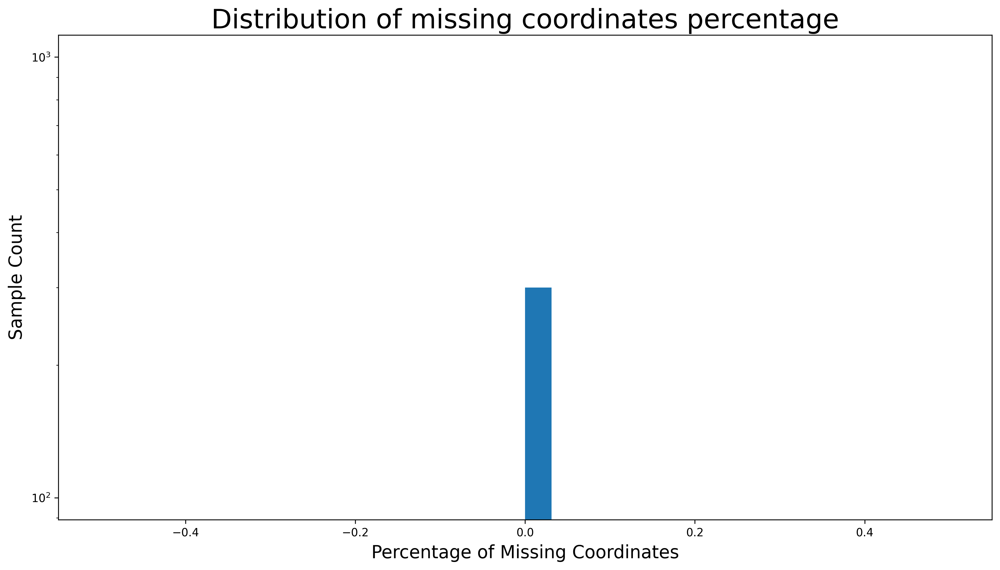

In [55]:
fig, axes = plt.subplots(1, 1, figsize=(15,8))
axes.set_yscale('log')
df['missing_coords_p'].plot(kind='hist', bins=32)
axes.set_ylabel('Sample Count', size=16, labelpad=5)
axes.set_xlabel('Percentage of Missing Coordinates', size=16, labelpad=5)
axes.set_title('Distribution of missing coordinates percentage', size=24)
plt.show()

In [56]:
display(df.info(max_cols=0))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 300 entries, 0 to 299
Columns: 120 entries, Unnamed: 0 to missing_coords_p
dtypes: bool(8), float64(5), int64(19), object(88)
memory usage: 265.0+ KB


None

In [57]:
# res = []
# for idx, row in df.iterrows():
#     if type(row['Person']) is str:
#         #C:\Users\markw\Documents\Maste Stage Videos\NGT Validation Cropped
#         file_name = row['Lemma ID Gloss (Dutch)'] + '-' + str(row['Signbank ID']) + '_Trim.mp4'
#         folder_path = 'Filmpjes ' + row['Person'].split('-')[0] + '/' + row['Person'].split('-')[0] + ' CROPPED/'
#         file_path = os.path.join('C:\\', 'Users', 'markw', 'Documents', 'Master Stage Videos', folder_path, file_name)
#         file_path = file_path.replace('\\', '/')
#     else:
#         file_path = ''
#     res.append(file_path)

In [58]:
# df[f'file_path{POSTFIX}'] = res

In [59]:
VIDEO_FOLDER_PATH = 'C:/Users/markw/Documents/Master Stage Videos/NGTvideos'
signs = [fp.replace('\\', '/') for fp in glob.glob(f'{VIDEO_FOLDER_PATH}/*.mp4') if 'small.mp4' not in fp]

def get_sign_by_name(name):
    for s in signs:
        sign_name = s.split('/')[-1]
        if sign_name.startswith(name):
            print(s)
            return s

In [60]:
# row = df.loc[df['Person'].apply(type) == str].sample(1).squeeze()
# row = df.loc[119].squeeze()
# row = df.loc[df['label'] == 117].squeeze()
row = df.loc[df['sign_names'] == 'PENSIOEN-B'].copy().squeeze()
# display(row.to_frame())

display(Video.from_file(row[f'file_path{POSTFIX}'], width=width))

KeyError: 'sign_names'

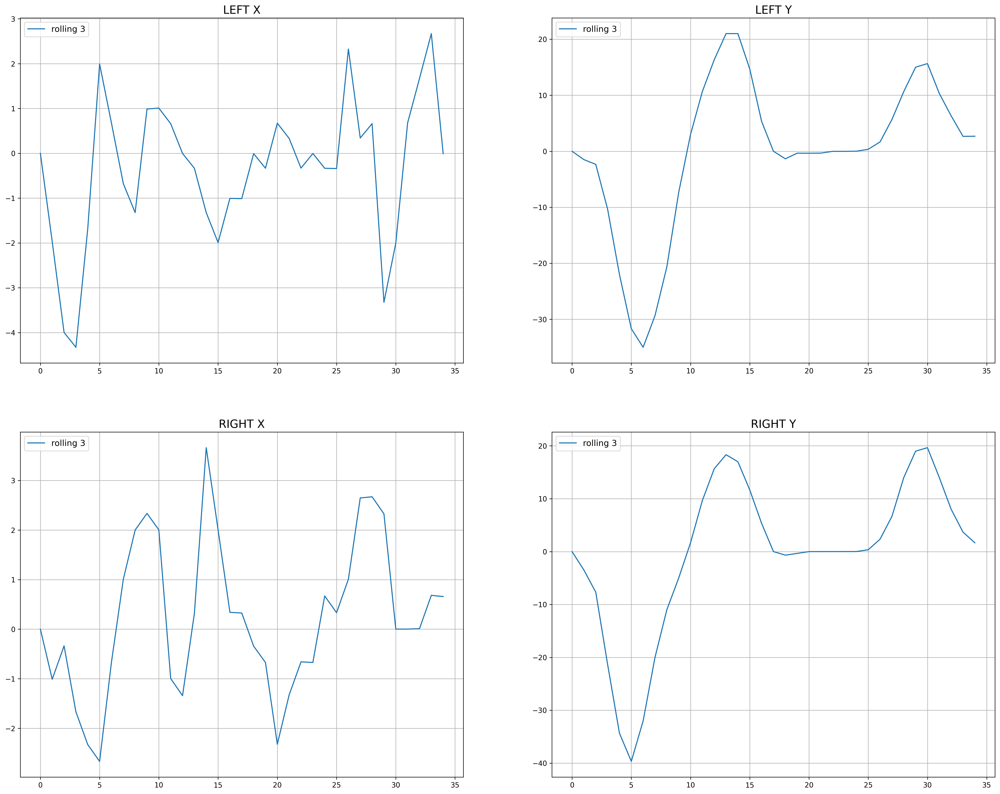

In [61]:
def plot_dxys(row, rolling_windows=[3]):
    def f(title, r, c):
        ax[r,c].set_title(title, size=16)
        key = title.lower().replace(' ', '_d')        
        for rw in rolling_windows:
            ax[r, c].plot(row[f'{key}_rolling{rw}_{FPS}fps{POSTFIX}'], label=f'rolling {rw}')
        ax[r,c].legend(loc='upper left', prop={'size': 12})
        ax[r,c].grid()
        
    fig, ax = plt.subplots(2, 2, figsize=(25,20))

    f('LEFT X', 0, 0)
    f('LEFT Y', 0, 1)
    f('RIGHT X', 1, 0)
    f('RIGHT Y', 1, 1)
    plt.show()
    
plot_dxys(row, rolling_windows=[3])

LEFT 40.999427795410156 325.63343302408856
RIGHT 42.018338521321624 344.18285115559894
RIGHT handed detected
optima_dx_index: [], optima_dy_index: [ 5 13 30]
False False 14 18.320841471354168
Other Frames a=[15 16 17 18 19 20 21 22 23 24 25], q=[50.0], start=10, end=26
start: 10 end: 26 other_frames: [14, 20], key_frames: [10, 14, 20, 26]
[-50. -40. -30. -20. -10.   0.  10.  20.  30.]
[-50. -40. -30. -20. -10.   0.  10.  20.  30.]
[-50. -40. -30. -20. -10.   0.  10.  20.  30.]
[-50. -40. -30. -20. -10.   0.  10.  20.  30.]


[]

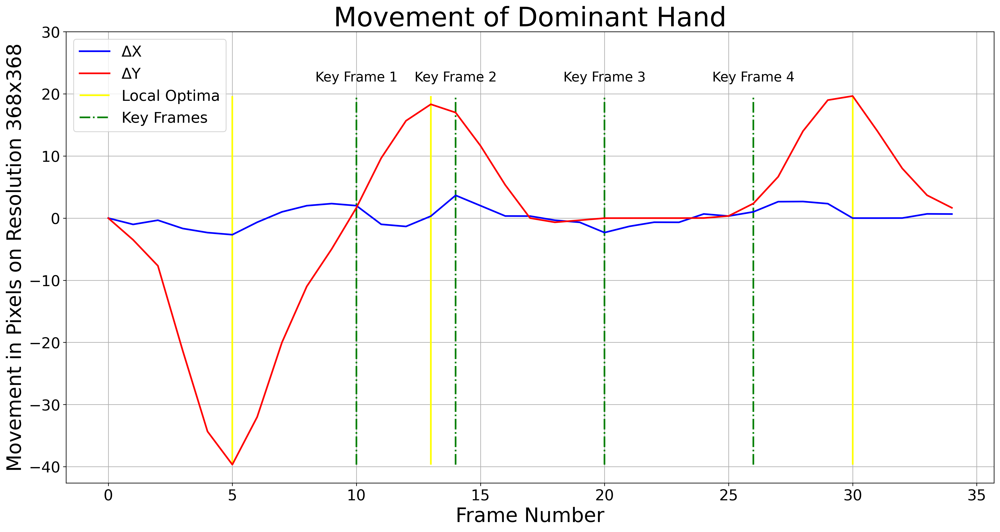

In [67]:
# Get Dominant Hand by Sum of Movement
def get_dominant_hand(row, debug=False):    
    left_dx = abs(np.array(row[f'left_dx_rolling{ROLLING_N}_{FPS}fps{POSTFIX}']))
    left_dy = abs(np.array(row[f'left_dy_rolling{ROLLING_N}_{FPS}fps{POSTFIX}']))
    
    right_dx = abs(np.array(row[f'right_dx_rolling{ROLLING_N}_{FPS}fps']))
    right_dy = abs(np.array(row[f'right_dy_rolling{ROLLING_N}_{FPS}fps']))
    
    if debug:
        print('LEFT', left_dx.sum(), left_dy.sum())
        print('RIGHT', right_dx.sum(), right_dy.sum())
    
    if (left_dx.sum() + left_dy.sum()) > (right_dx.sum() + right_dy.sum()):
        return 'LEFT'
    else:
        return 'RIGHT'
    
# Get Local Optima and Minima of Vector for given Window
def local_optima_mask(vec, window, threshold=TARGET_SIZE * 0.01, window_right=None, debug=False):
    maxlen = 1 + window + (window if window_right is None else window_right)
    que = deque([], maxlen=maxlen)
    size = len(vec)
    res = [] # optima flag, 0=not, 1=optima, -1=minima
    res_v = [] # values of optima
    
    for idx, i in enumerate(vec):
        que.append(i)
        que_np = np.array(que)
        if len(que) == maxlen:
            T = que_np[window]
            L = que_np[:(window)]
            R = que_np[-(window if window_right is None else window_right):]
            # Local Maximima
            if ((T > L) & (T > R) & (T > threshold)).all():
                res.append(1)
                res_v.append(T)
            # Local Minima
            elif ((T < L) & (T < R) & (np.abs(T) > threshold)).all():
                res.append(-1)
                res_v.append(T)
            else:
                res.append(0)
                res_v.append(0)
        elif idx >= window:
            res.append(0)
            res_v.append(0)
            
    # fill up tail
    for _ in range(window):
        res.append(0)
        
    # Preemptive recording stopping
    if (vec[-maxlen:] == np.sort(vec[-maxlen:])).all():
        res[-1] = 1
        res_v[-1] = vec[-1]
            
    return res, res_v

def get_start_index(values, offset, optima_dx_index):
    for idx, v in enumerate(values):
        # Found Static Frame
        if idx > offset and abs(v) <= TARGET_SIZE * 0.01:
            return max(OF_FRAMES  + 1, idx)
        
        # Found Delta X optima before static frame
        if idx in optima_dx_index:
            return max(OF_FRAMES + 1, idx)
        
def get_end_index(vec_dy, window, start):
    optima_dy, _ = local_optima_mask(vec_dy, window, window_right=1)
    optima_dy_index = np.nonzero(optima_dy)[0]
    offset = optima_dy_index[-1]
    for idx, v in enumerate(reversed(vec_dy)):
        # Found Static Frame
        if idx > (len(vec_dy) - offset) and abs(v) <= TARGET_SIZE * 0.01 and v != 0:
            return max(len(vec_dy) - idx - 1, start + 1)
        
    # Fallback to first non-zero
    for idx, v in enumerate(reversed(vec_dy)):
        # Found Static Frame
        if idx > (len(vec_dy) - offset) and abs(v) <= TARGET_SIZE * 0.01:
            return max(len(vec_dy) - idx - 1, start + 1)
            
def check_start_end_frames(start, end):
    if end - start == 1:
        return start - 1, end + 1
    elif end - start == 2:
        return start - 1, end
    else:
        return start, end

def get_openpose_key_frames(row, window=2, debug=False):
    # Empty Video Base Case
    if len(row[f'left_dx_rolling{ROLLING_N}_{FPS}fps{POSTFIX}']) == 0:
        return tuple([])
    # Get Rolling DX/DY of Dominant Hand
    handedness = get_dominant_hand(row, debug=debug)
    if handedness  == 'LEFT':
        if debug:
            print(f'LEFT handed detected')
        vec_dx = np.array(row[f'left_dx_rolling{ROLLING_N}_{FPS}fps{POSTFIX}'])
        vec_dy = np.array(row[f'left_dy_rolling{ROLLING_N}_{FPS}fps{POSTFIX}'])
    else:
        if debug:
            print(f'RIGHT handed detected')
        vec_dx = np.array(row[f'right_dx_rolling{ROLLING_N}_{FPS}fps{POSTFIX}'])
        vec_dy = np.array(row[f'right_dy_rolling{ROLLING_N}_{FPS}fps{POSTFIX}'])
    
    # Get Optima of DX/DY series
    optima_dx, optima_dx_v = local_optima_mask(vec_dx, window, debug=debug)
    optima_dy, optima_dy_v = local_optima_mask(vec_dy, window, debug=debug)
        
    # Convert Optima to Indices
    optima = np.abs(optima_dx) + np.abs(optima_dy)
    optima_dx_index = np.nonzero(optima_dx)[0]
    optima_dy_index = np.nonzero(optima_dy)[0]
    optima_dxy_index = np.concatenate((np.nonzero(optima_dx)[0], np.nonzero(optima_dy)[0]))
    optima_dxy_index = np.unique(optima_dxy_index)
    
    if debug:
        print(f'optima_dx_index: {optima_dx_index}, optima_dy_index: {optima_dy_index}')
    
    other_frames = []
    if len(optima_dy_index) >= 2: # use next and previous optima
        start = get_start_index(vec_dy, optima_dy_index[0], optima_dx_index)
        end = get_end_index(vec_dy, window, start)
    elif window > 1:
        print(f'Recursion with decreasing window from {window} to {window-1}, idx:  {row["index"]}')
        return get_openpose_key_frames(row, window-1, debug=debug)
    else:
        start = get_start_index(vec_dy, 0, optima_dx_index)
        end = get_end_index(vec_dy, window, start)
        print(f'Couldnt find start/end, idx: {row["index"]}')
        
    # Check Start/End frames
    try:
        start, end = check_start_end_frames(start, end)
    except:
        raise Exception(f'Could not verify start end for idx: {row["index"]}, start: {start}, end: {end}')
    
    # Add Intermediate Frames
    in_between_optima = [e for e in optima_dxy_index if e > start and e < end]
    if len(in_between_optima) > 0:
        optima_dx_index_between = [e for e in optima_dx_index if e > start + OF_FRAMES - 1 and e < end - OF_FRAMES + 1]
        optima_dy_index_between = [e for e in optima_dy_index if e > start + OF_FRAMES - 1 and e < end - OF_FRAMES + 1]

        # Edge Case when optical flow range from edges is not possible
        if len(optima_dx_index_between) + len(optima_dy_index_between) < 2:
            optima_dx_index_between = [e for e in optima_dx_index if e > start and e < end]
            optima_dy_index_between = [e for e in optima_dy_index if e > start and e < end]

        optima_dx_index_between_v = [optima_dx_v[i] for i in optima_dx_index_between]
        optima_dy_index_between_v = [optima_dy_v[i] for i in optima_dy_index_between]

        in_between_frames_data = zip(optima_dx_index_between + optima_dy_index_between, optima_dx_index_between_v + optima_dy_index_between_v)
        in_between_frames = [(index, value) for index, value in in_between_frames_data]
        in_between_frames = sorted(in_between_frames, key=lambda T: abs(T[1]), reverse=True)

        # Add Frames with Optical Flow Frames from Start and End Restriction
        for index, value in [(index + OF_FRAMES // 2, value) for index, value in in_between_frames]:
            if debug:
                print(index - start < OF_FRAMES , end - index < OF_FRAMES, index, value)
            if not(index - start < OF_FRAMES or end - index < OF_FRAMES):
                if len(other_frames) == 0 or (len(other_frames) == 1 and abs(other_frames[0] - index) > OF_FRAMES):
                    other_frames.append(index)
        
    if len(other_frames) != 2: # fall back to linear key frame extraction
        # Already added one other in between frame
        if len(other_frames) == 1:
            q = [50.00]
            if other_frames[0] - start > end - other_frames[0]:
                a = np.arange(start + 1, other_frames[0])
            else:
                a = np.arange(other_frames[0] + 1, end)
        else:        
            a = np.arange(start + 1, end)
            q = [33, 67]
        if debug:
            print(f'Other Frames a={a}, q={q}, start={start}, end={end}')
            
        # Edge case for 2 or 3 options
        if len(a) < 4:
            other_frames = [a[0], a[-1]]
        else:    
            other_frames += list(np.percentile(a=a, q=q, interpolation='nearest'))
        
    # Key Frame Length Sanity Check
    key_frames = tuple(np.sort([start] + other_frames + [end]))
    if len(key_frames) != 4 or len(set(key_frames)) < 4:
        raise Exception(f'Key Frames Length {len(key_frames)} Does NOT Equal 4 or duplicates, key_frames: {key_frames}')
    
    if debug:
        return start, end, optima, other_frames, handedness, key_frames
    else:
        return key_frames

start, end, optima, other_frames, handedness, key_frames = get_openpose_key_frames(row, debug=True)
key_frames = [start] + list(other_frames) + [end]
print(f'start: {start}', f'end: {end}', f'other_frames: {other_frames}, key_frames: {key_frames}')

vec_dx = row[f'{handedness.lower()}_dx_rolling{ROLLING_N}_{FPS}fps{POSTFIX}']
vec_dy = row[f'{handedness.lower()}_dy_rolling{ROLLING_N}_{FPS}fps{POSTFIX}']

vec_min = np.minimum(vec_dx, vec_dy).min()
vec_max = np.maximum(vec_dx, vec_dy).max()

plt.figure(figsize=(20, 10))
plt.plot(vec_dx, color='blue', label='ΔX', linewidth=2)
plt.plot(vec_dy, color='red', label='ΔY', linewidth=2)
plt.grid()
plt.vlines(np.nonzero(optima), vec_min, vec_max, color='yellow', label='Local Optima', linewidth=2)
plt.vlines(key_frames, vec_min, vec_max, color='green', linestyle='dashdot', label='Key Frames', linewidth=2)
# Add Legenda
plt.legend(fontsize=18, title_fontsize=16)
# Add Title
plt.title(f'Movement of Dominant Hand', size=32)
# Add x label and increase ticks size
plt.xticks(size=18)
plt.xlabel('Frame Number', size=24)
# Add y label and increase ticks size
plt.yticks(size=18)
plt.ylabel(f'Movement in Pixels on Resolution {TARGET_SIZE}x{TARGET_SIZE}', size=24)
# Add Key Frame labels
xmin, xmax, ymin, ymax = plt.axis()
yticks, _ = plt.yticks()
for i, key_frame in enumerate(key_frames):
    plt.text(key_frame, ymax, f'Key Frame {i+1}', rotation=0, verticalalignment='center', size=16, ha='center', va='center')
    print(yticks)
plt.ylim(top=max(yticks))
plt.plot()

# df[f'open_pose_key_frames{POSTFIX}'] = df.progress_apply(get_openpose_key_frames, axis=1)

In [68]:
l = np.zeros(shape=(36, 28,28,3))

frame_idxs = []
for idx in range(len(l)):
    if idx % 9 >= 9 - 3 - 2 * 0:
        frame_idxs.append(idx)
    
print(frame_idxs)

[6, 7, 8, 15, 16, 17, 24, 25, 26, 33, 34, 35]


In [98]:
other_frames

[14, 20]

In [99]:
def plot_frames(row, frames=None, plot_title=False):
    file_path = row[f'file_path{POSTFIX}']
    vid = cv2.VideoCapture(file_path)
    fps_video = vid.get(cv2.CAP_PROP_FPS)
    fps_ratio = fps_video / FPS
    counter = 0
    frame_counter = 0
    frames_plotted = 0
    while vid.isOpened():
        succes, frame = vid.read()
        if succes:
            if int(frame_counter % fps_ratio) == 0:
                if frames is None or counter in frames:
                    if frames_plotted % 4 == 0:
                        fig, ax = plt.subplots(1, 4, figsize=(20,5))
                        if plot_title:
                            fig.suptitle('Selected Key Frames', fontsize=32)

                    frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
                    ax[frames_plotted % 4].imshow(frame)
                    ax[frames_plotted % 4].set_title(f'Frame {counter}', size=24)
                    ax[frames_plotted % 4].axis(False)

                    if frames_plotted % 4 == 3:
                        plt.plot()
                        
                    frames_plotted += 1
                
                counter += 1
            frame_counter += 1
        else:
            return

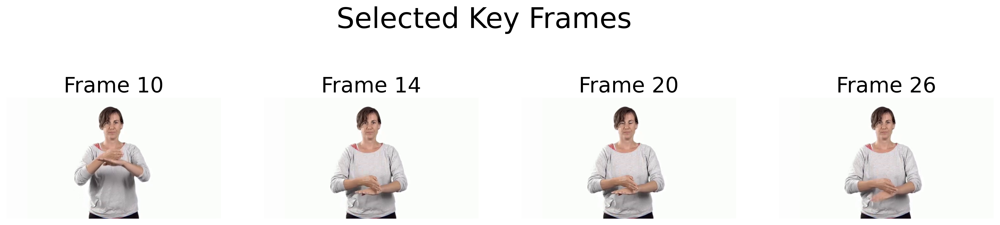

In [97]:
plot_frames(row, frames=[start, end] + list(other_frames))

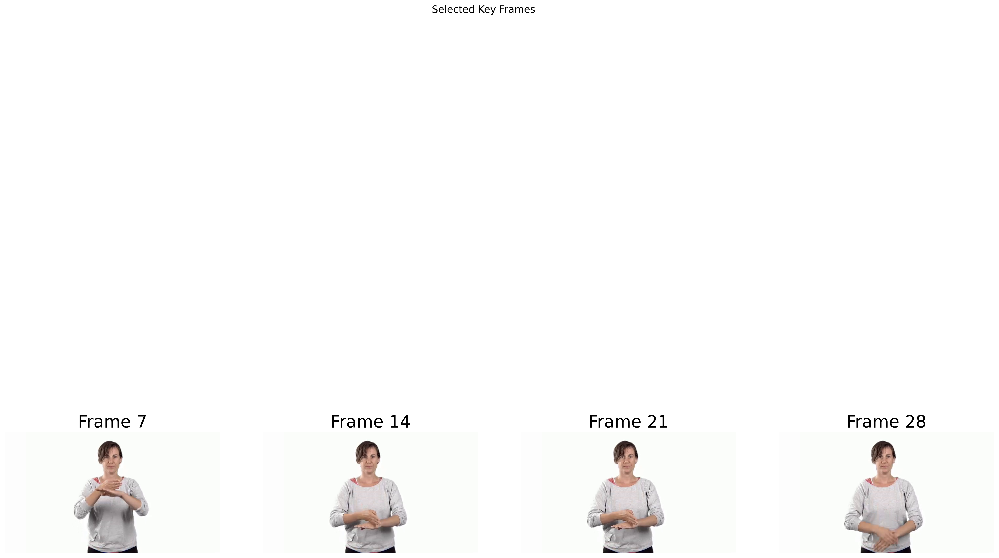

In [86]:
plot_frames(row, frames=[int(i * row['frame_count'] / 5) for i in range(1,5)])

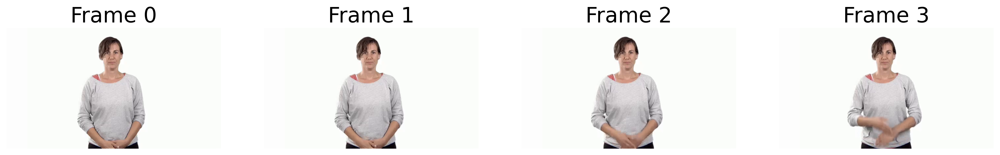

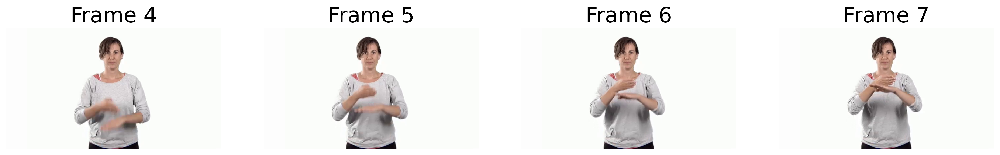

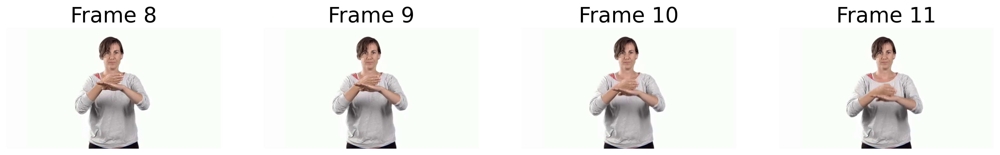

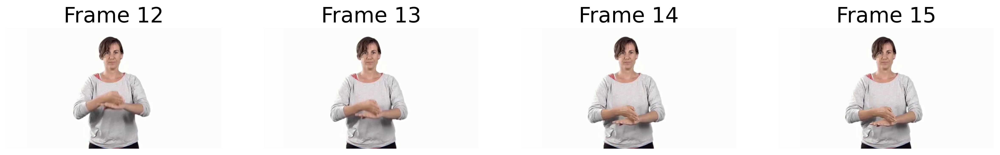

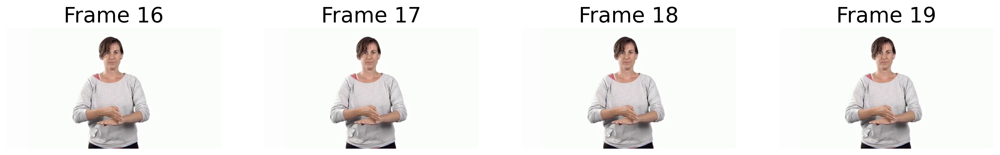

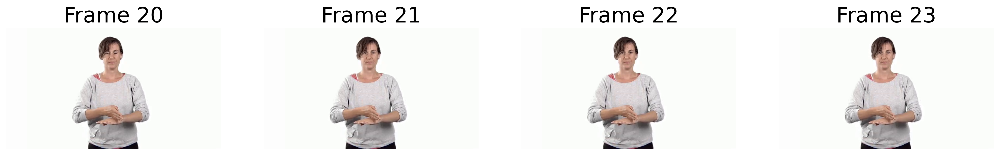

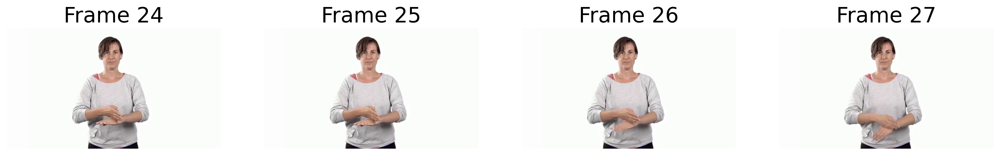

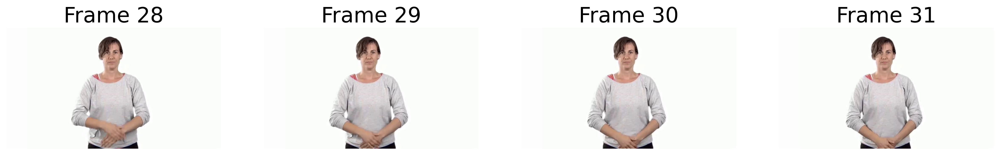

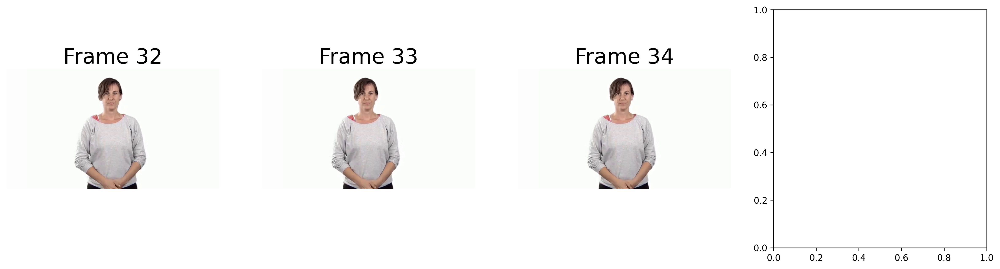

In [100]:
plot_frames(row)

In [232]:
# Save OpenPose Key Frame Extraction DataFrame
df.to_pickle(f'{file}_open_pose_kfe{POSTFIX}.pkl.xz')

# NGT Handedness

In [61]:
# read SignBank CSV
ngt_signbank = pd.read_csv('ngt_signbank.csv', usecols=['Signbank ID', 'Handedness'])
display(ngt_signbank.sample(5))
print('Handedness value counts')
display(ngt_signbank['Handedness'].value_counts())

,Signbank ID,Handedness
527,933,1
222,2076,1
2671,3607,X
3345,4097,2s
3911,3446,-


Handedness value counts


1     1941
2s    1173
2a     468
-      402
X      121
2n      31
Name: Handedness, dtype: int64

In [62]:
def normalize_handedness(s):
    s = str(s)
    if s == '1':
        return 1
    elif '2' in s:
        return 2
    else:
        return None

# normalize handedness
ngt_signbank['HandednessNorm'] = ngt_signbank['Handedness'].apply(normalize_handedness)
display(ngt_signbank.sample(5))
print('HandednessNorm value counts')
display(ngt_signbank['HandednessNorm'].value_counts())

,Signbank ID,Handedness,HandednessNorm
816,1632,1,1.0
184,3539,X,NaN
1955,2950,1,1.0
3288,4542,1,1.0
261,1783,2s,2.0


HandednessNorm value counts


1.0    1941
2.0    1672
Name: HandednessNorm, dtype: int64

In [63]:
# merge
train_ngt_dxy = train_ngt_dxy.merge(ngt_signbank, on='Signbank ID')
display(train_ngt_dxy.sample(5))

,file_path,file_name,sign_names,label,is_studio,frame_count,folder_index,Signbank ID,left_dx_rolling1_10fps,left_dy_rolling1_10fps,...,left_dx_rolling4_10fps,left_dy_rolling4_10fps,right_dx_rolling4_10fps,right_dy_rolling4_10fps,left_dx_rolling5_10fps,left_dy_rolling5_10fps,right_dx_rolling5_10fps,right_dy_rolling5_10fps,Handedness,HandednessNorm
1742,C:/Users/markw/Documents/Maste Stage Videos/NGTvideos/KNOOP-3034.mp4,KNOOP-3034.mp4,KNOOP,1807,True,40,1762,3034,"(0.0, -1.0005950927734375, -12.980819702148438, -16.983489990234375, -7.01513671875, -1.9605407...","(0.0, -0.005462646484375, -0.004150390625, -42.0390625, -55.955902099609375, -45.99624633789062...",...,"(0.0, -0.5002975463867188, -4.660471598307292, -7.7412261962890625, -9.495010375976562, -9.7349...","(0.0, -0.0027313232421875, -0.003204345703125, -10.512168884277344, -24.501144409179688, -35.99...","(0.0, -0.49395751953125, -1.6701583862304688, -1.0062942504882812, 1.7465782165527344, 9.734441...","(0.0, 0.4932708740234375, 2.327301025390625, 0.2574615478515625, -6.5008544921875, -18.49078369...","(0.0, -0.5002975463867188, -4.660471598307292, -7.7412261962890625, -7.59600830078125, -7.98811...","(0.0, -0.0027313232421875, -0.003204345703125, -10.512168884277344, -19.60091552734375, -28.800...","(0.0, -0.49395751953125, -1.6701583862304688, -1.0062942504882812, 1.3972625732421875, 7.589970...","(0.0, 0.4932708740234375, 2.327301025390625, 0.2574615478515625, -5.20068359375, -14.5953186035...",2s,2.0
524,C:/Users/markw/Documents/Maste Stage Videos/NGTvideos/BIJ-C-2217.mp4,BIJ-C-2217.mp4,BIJ-C,531,True,40,525,2217,"(0.0, 1.0150299072265625, -0.0327301025390625, 2.002349853515625, 11.030303955078125, 10.974136...","(0.0, -3.953125, -2.011138916015625, -9.965606689453125, -25.054443359375, -25.0054931640625, -...",...,"(0.0, 0.5075149536132812, 0.3274332682291667, 0.7461624145507812, 3.5037384033203125, 5.9935150...","(0.0, -1.9765625, -1.9880879720052083, -3.9824676513671875, -10.246078491210938, -15.5091705322...","(0.0, -0.030303955078125, -7.6695556640625, -5.998931884765625, -6.253826141357422, -2.24789810...","(0.0, -0.0003204345703125, -6.672800699869792, -4.511222839355469, -4.5015716552734375, 0.00115...","(0.0, 0.5075149536132812, 0.3274332682291667, 0.7461624145507812, 2.80299072265625, 4.997817993...","(0.0, -1.9765625, -1.9880879720052083, -3.9824676513671875, -8.19686279296875, -13.197961425781...","(0.0, -0.030303955078125, -7.6695556640625, -5.998931884765625, -5.003060913085937, -1.81044006...","(0.0, -0.0003204345703125, -6.672800699869792, -4.511222839355469, -3.60125732421875, 0.0007995...",2a,2.0
1849,C:/Users/markw/Documents/Maste Stage Videos/NGTvideos/LEERLING-A-2619.mp4,LEERLING-A-2619.mp4,LEERLING-A,1917,True,38,1869,2619,"(0.0, -0.0171661376953125, 1.001556396484375, -0.99249267578125, 0.996063232421875, 0.009857177...","(0.0, 0.008209228515625, -0.00555419921875, 0.0079345703125, -0.0069580078125, -0.0080261230468...",...,"(0.0, -0.00858306884765625, 0.3281300862630208, -0.002025604248046875, 0.24699020385742188, 0.2...","(0.0, 0.0041046142578125, 0.000885009765625, 0.00264739990234375, 0.00090789794921875, -0.00315...","(0.0, 0.492523193359375, 0.3257548014322917, -0.001209259033203125, 0.24013519287109375, -1.001...","(0.0, 0.5007781982421875, 0.3332316080729167, -0.2415618896484375, -0.00017547607421875, -0.986...","(0.0, -0.00858306884765625, 0.3281300862630208, -0.002025604248046875, 0.1975921630859375, 0.19...","(0.0, 0.0041046142578125, 0.000885009765625, 0.00264739990234375, 0.000726318359375, -0.0008789...","(0.0, 0.492523193359375, 0.3257548014322917, -0.001209259033203125, 0.192108154296875, -0.60385...","(0.0, 0.5007781982421875, 0.3332316080729167, -0.2415618896484375, -0.000140380859375, -0.58876...",NaN,NaN
1116,C:/Users/markw/Documents/Maste Stage Videos/NGTvideos/GEBEUREN-A-1048.mp4,GEBEUREN-A-1048.mp4,GEBEUREN-A,1159,True,34,1130,1048,"(0.0, 0.0179595947265625, 1.9736785888671875, 8.030197143554688, 5.9991607666015625, -3

In [158]:
train_ngt_dxy

,file_path,file_name,sign_names,label,is_studio,frame_count,folder_index,Signbank ID,left_dx_rolling1_10fps,left_dy_rolling1_10fps,...,left_dy_rolling4_10fps,right_dx_rolling4_10fps,right_dy_rolling4_10fps,left_dx_rolling5_10fps,left_dy_rolling5_10fps,right_dx_rolling5_10fps,right_dy_rolling5_10fps,Handedness,HandednessNorm,Handedness Predicted
0,C:/Users/markw/Documents/Maste Stage Videos/NGTvideos/#A-3808.mp4,#A-3808.mp4,#A,0,True,31,0,3808,"(0.0, -0.013702392578125, -0.0022430419921875, 4.9833221435546875, -0.0057373046875, 0.04003906...","(0.0, 0.97222900390625, -0.98895263671875, -1.01397705078125, 0.014129638671875, -1.05078125, 0...",...,"(0.0, 0.486114501953125, -0.005574544270833333, -0.2576751708984375, -0.25414276123046875, -0.7...","(0.0, 0.0010986328125, -4.6719970703125, -11.257658004760742, -16.25483512878418, -21.756418228...","(0.0, 0.4927215576171875, -2.3442789713541665, -14.001640319824219, -24.25463104248047, -37.485...","(0.0, -0.0068511962890625, -0.005315144856770833, 1.2418441772460938, 0.992327880859375, 1.0003...","(0.0, 0.486114501953125, -0.005574544270833333, -0.2576751708984375, -0.203314208984375, -0.413...","(0.0, 0.0010986328125, -4.6719970703125, -11.257658004760742, -13.003868103027344, -17.40469512...","(0.0, 0.4927215576171875, -2.3442789713541665, -14.001640319824219, -19.403704833984374, -29.79...",1,1.0,True
1,C:/Users/markw/Documents/Maste Stage Videos/NGTvideos/#B-3809.mp4,#B-3809.mp4,#B,1,True,31,1,3809,"(0.0, 1.9644317626953125, -0.0078125, 0.994171142578125, 2.9813232421875, 0.0075531005859375, -...","(0.0, -4.9708251953125, 0.00933837890625, 3.941070556640625, -1.9759521484375, -1.0029602050781...",...,"(0.0, -2.48541259765625, -1.6538289388020833, -0.25510406494140625, -0.7490921020507812, 0.2428...","(0.0, -3.4920806884765625, -4.995005289713542, -12.007160186767578, -16.007579803466797, -16.51...","(0.0, -2.9847564697265625, -7.659403483072917, -21.24176788330078, -29.752479553222656, -36.759...","(0.0, 0.9822158813476562, 0.6522064208984375, 0.7376976013183594, 1.1864227294921874, 1.1879333...","(0.0, -2.48541259765625, -1.6538289388020833, -0.25510406494140625, -0.599273681640625, -0.7998...","(0.0, -3.4920806884765625, -4.995005289713542, -12.007160186767578, -12.806063842773437, -14.61...","(0.0, -2.9847564697265625, -7.659403483072917, -21.24176788330078, -23.801983642578126, -30.601...",1,1.0,True
2,C:/Users/markw/Documents/Maste Stage Videos/NGTvideos/#C-3810.mp4,#C-3810.mp4,#C,2,True,30,2,3810,"(0.0, -1.009979248046875, 0.0061798095703125, 2.9918975830078125, 1.0074005126953125, 0.9925842...","(0.0, 1.013702392578125, 0.965545654296875, -4.929962158203125, 0.00323486328125, 0.94909667968...",...,"(0.0, 0.5068511962890625, 0.6597493489583334, -0.7376785278320312, -0.7368698120117188, -0.7530...","(0.0, 0.00383758544921875, 0.005218505859375, -5.502399444580078, -13.24822998046875, -19.00902...","(0.0, 0.4886932373046875, -0.0019429524739583333, -5.261375427246094, -15.254859924316406, -31....","(0.0, -0.5049896240234375, -0.3345998128255208, 0.4970245361328125, 0.5990997314453125, 0.79761...","(0.0, 0.5068511962890625, 0.6597493489583334, -0.7376785278320312, -0.589495849609375, -0.39967...","(0.0, 0.00383758544921875, 0.005218505859375, -5.502399444580078, -10.598583984375, -15.2056884...","(0.0, 0.4886932373046875, -0.0019429524739583333, -5.261375427246094, -12.203887939453125, -24....",1,1.0,True
3,C:/Users/markw/Documents/Maste Stage Videos/NGTvideos/#D-3811.mp4,#D-3811.mp4,#D,3,True,31,3,3811,"(0.0, -0.0216827392578125, 0.0353546142578125, 0.969146728515625, 0.99822998046875, 0.996322631...","(0.0, 0.959136962890625, -0.971771240234375, -4.00390625, -0.007781982421875, -0.00540161132812...",...,"(0.0, 0.4795684814453125, -0.00421142578125, -1.0041351318359375, -1.0060806274414062, -1.24721...","(0.0, 0.9865646362304688, 0.9886983235677084, -2.005504608154297, -5.757072448730469, -14.74409...","(0.0, 0.021759033203125, 0.009602864583333334, -2.2544479370117188, -8.4

In [389]:
def get_delta_distace(l, noise_threshold):
    return sum([abs(d) for d in l if abs(d) > noise_threshold])

def predict_salient_part(row, rw, distance_threshold_x, distance_threshold_y, noise_threshold, debug=False):
    try:
        ngt_handedness = int(row["HandednessNorm"])
    except:
        return None
    
    # DELTAS
    left_dx = row[f'left_dx_rolling{rw}{FPS_POSTFIX}']
    left_dy = row[f'left_dy_rolling{rw}{FPS_POSTFIX}']
    right_dx = row[f'right_dx_rolling{rw}{FPS_POSTFIX}']
    right_dy = row[f'right_dy_rolling{rw}{FPS_POSTFIX}']
    # LEFT
    left_dx_distance = get_delta_distace(left_dx, noise_threshold)
    left_dy_distance = get_delta_distace(left_dy, noise_threshold)
    left_distance = left_dx_distance + left_dy_distance
    # RIGHT
    right_dx_distance = get_delta_distace(right_dx, noise_threshold)
    right_dy_distance = get_delta_distace(right_dy, noise_threshold)
    right_distance = right_dx_distance + right_dy_distance
    
    # predict handedness
    if (
        (left_dx_distance < distance_threshold_x and left_dy_distance < distance_threshold_y) or
        (right_dx_distance < distance_threshold_x and right_dy_distance < distance_threshold_y)
    ):
        predicted_handedness = 1
    else:
        predicted_handedness = 2
        
    # check if correctly predicted
    correct = predicted_handedness == ngt_handedness
        
    if debug and predicted_handedness != ngt_handedness:
        print(f'NGT Handedness: {ngt_handedness}, predicted handedness: {predicted_handedness}, correct: {correct}')
        print(f'left_dx_distance: %d, left_dy_distance: %d, left_distance: %d' % (left_dx_distance, left_dy_distance, left_distance))
        print(f'right_dx_distance: %d, right_dy_distance: %d, right_distance: %d' % (right_dx_distance, right_dy_distance, right_distance))
        
    return correct

from IPython.display import Video
for idx, row in tqdm(train_ngt_dxy.iterrows(), total=len(train_ngt_dxy)):
    correct = predict_salient_part(row, rw=5, distance_threshold_x=120, distance_threshold_y=50, noise_threshold=0, debug=True)
    if type(correct) == bool and not correct:
        print(idx, row['file_path'])
        display(Video(row['file_path'], embed=True))

In [154]:
res = dict()
for x in tqdm(range(8,15)):
    for y in range(3,8):
        for nt in range(0,3):
            dtx = x * 10
            dty = y * 10
            train_ngt_dxy['Handedness Predicted'] = train_ngt_dxy.apply(lambda row: predict_salient_part(row, 5, dtx, dty, nt), axis=1)
            acc = train_ngt_dxy['Handedness Predicted'].value_counts(normalize=True)[True]
            res[(dtx, dty, nt)] = acc

In [155]:
# plt.figure(figsize=(10,15))
# pd.Series(res).plot(kind='bar')
# plt.grid()
pd.Series(res).sort_values()

140  30  0    0.972054
130  30  0    0.972054
80   30  0    0.972342
120  30  0    0.972342
110  30  0    0.972342
                ...   
100  40  2    0.981562
110  40  2    0.981562
     50  0    0.981562
120  40  2    0.981562
     50  0    0.981562
Length: 105, dtype: float64

# Debug Plots

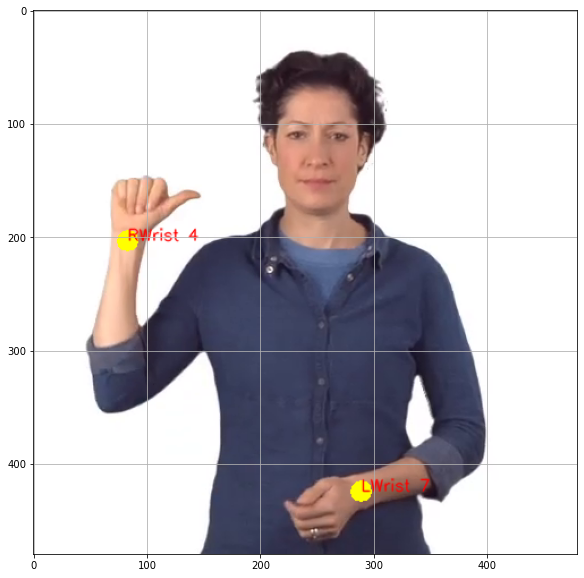

In [218]:
def plot_frame_pose(probability_maps, frame_original, THRESHOLD=0.50):
    # ensure for correct shape
    if len(probability_maps.shape) == 3:
        probability_maps = probability_maps[0]
        
    # wrist only check
    wrists_only = len(probability_maps) == 2
        
    # copy frame to not modigy original
    frame = frame_original.copy()
    # dimensions of image
    frame_width, frame_height, _ = frame.shape
    # dictionary mapping a body keypoint to the pixel coordinates
    points = dict()
    for idx, (p_x, p_y, prob) in enumerate(probability_maps):
        # custom keypoint index when wrists only
        if wrists_only:
            idx = WRISTS_IDXS[idx]
        
        if prob > THRESHOLD:
            # draw keypoint with corresponding name
            CIRCLE_SIZE = int(math.sqrt(frame_width * frame_height) * 2e-2)
            cv2.circle(frame, (p_x, p_y), CIRCLE_SIZE, (0, 255, 255), thickness=-1, lineType=cv2.FILLED)
            KEYPOINT_TEXT = BODY25_IDX_2_KEYPOINT[idx] + f' {idx}'
            TEXT_SIZE = math.sqrt(frame_width * frame_height) * 1e-3
            TEXT_THICKNESS = int(math.sqrt(frame_width * frame_height) * 2e-3)
            cv2.putText(frame, KEYPOINT_TEXT, (p_x, p_y), cv2.FONT_HERSHEY_SIMPLEX, TEXT_SIZE, (0, 0, 255), TEXT_THICKNESS, lineType=cv2.LINE_AA)

            # Add the point to the list if the probability is greater than the threshold
            points[BODY25_IDX_2_KEYPOINT[idx]] = (p_x, p_y)
        else :
            points[BODY25_IDX_2_KEYPOINT[idx]] = None
            
    # Draw Skeleton
    if not wrists_only:
        points_v = list(points.values())
        for (p_a, p_b) in [(points_v[a], points_v[b]) for (a, b) in BODY25_PAIRS if a < len(points_v) and b < len(points_v)]:
            if p_a and p_b:
                LINE_WIDTH = int(math.sqrt(frame_width * frame_height) * 5e-3)
                cv2.line(frame, p_a, p_b, (0, 255, 255), LINE_WIDTH)
                CIRCLE_SIZE = int(math.sqrt(frame_width * frame_height) * 5e-3)
                cv2.circle(frame, p_a, CIRCLE_SIZE, (0, 0, 255), thickness=-1, lineType=cv2.FILLED)
                cv2.circle(frame, p_b, CIRCLE_SIZE, (0, 0, 255), thickness=-1, lineType=cv2.FILLED)
            
    plot(frame)

plot_frame_pose(body_keypoints, frame)